# **Практическая работа №9. Использование модели YOLOv26 для решение задач детекции и классификации**

## **Задание 1. Знакомство с новейшей версией модели YOLO**

- Ознакомьтесь с технической документацией по новейшей версии модели YOLOv26: https://docs.ultralytics.com/ru/models/yolo26/

- Рассмотрите пример обучения этой модели c использованием датасетов, созданных в Roboflow: https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolo26-object-detection-on-custom-dataset.ipynb?ref=blog.roboflow.com

### **Ответьте на вопрос: Какие принципиальные отличия появились в модели YOLOv26 относительно предыдущих версий?**

**1. Нативная архитектура без NMS (End-to-End)**

Впервые в семействе YOLO модель работает без этапа постобработки Non-Maximum Suppression (NMS). Предсказания выдаются напрямую, что ускоряет инференс и упрощает развёртывание.

**2. Удаление Distribution Focal Loss (DFL)**

В YOLOv8/v9/v11 использовался модуль DFL для предсказания ограничивающих рамок. В YOLOv26 он полностью удалён — это упрощает архитектуру и расширяет поддержку edge-устройств (TFLite, CoreML, OpenVINO, TensorRT, ONNX).

**3. Новый оптимизатор MuSGD**

Введён гибридный оптимизатор MuSGD — комбинация классического SGD и алгоритма Muon (заимствованного из обучения больших языковых моделей). Обеспечивает более стабильную и быструю сходимость при обучении.

**4. Progressive Loss Balancing (ProgLoss) + STAL**

Новая схема балансировки потерь ProgLoss в сочетании с Small-Target-Aware Label Assignment (STAL) значительно улучшает детекцию мелких объектов — исторически слабое место YOLO.

**5. Скорость на CPU +43%**

По сравнению с YOLO11, модель YOLOv26n работает примерно на 43% быстрее на процессоре при сопоставимой точности, что делает её пригодной для устройств без GPU.

**6. Расширенная мультизадачность**

Улучшена поддержка смежных задач: семантическая сегментация, оценка позы (keypoints), ориентированные bounding box (OBB) — каждая с отдельно оптимизированными функциями потерь.

*Примечание:* для каждого последующего задания, в конечном итоге, необходимо сформировать обученную модель и задеплоить её на сервисе **RoboFlow**



## **Задание 2. Найдите готовый датасет для детекции объектов и обучите на нем модель YOLOv26:**

- Для удобства работы с датасетом и деплоя модели используйте сервис [RoboFlow](https://roboflow.com/)

In [1]:
# Установка основных библиотек
# ultralytics - основная библиотека для работы с YOLO
# roboflow - для загрузки датасетов и деплоя моделей
# supervision - для визуализации результатов детекции


!pip install -q ultralytics roboflow supervision inference pycuda

# Подавляем предупреждения для чистоты вывода
import warnings
warnings.filterwarnings('ignore')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 39.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.7/105.7 kB 12.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.6/68.6 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.4/99.4 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 5.1 MB/s eta 0:00:00
     ━━

In [2]:
!pip install -q --upgrade ultralytics Pillow

In [ ]:

from roboflow import Roboflow
rf = Roboflow(api_key="9EGEPV4Akg5FiugcLz0k")
project = rf.workspace("study-btrrr").project("animals-jslww-inpuu")
version = project.version(1)
dataset = version.download("yolov8")



loading Roboflow workspace...
loading Roboflow project...


In [ ]:
from ultralytics import YOLO

model = YOLO("yolo26n.pt")

results = model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    name="animals3_yolo26"
)

Ultralytics 8.4.48 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Animals-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=animals3_yolo26, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pati

In [ ]:
metrics = model.val()
print(f"mAP50:     {metrics.box.map50:.3f}")
print(f"mAP50-95:  {metrics.box.map:.3f}")
print(f"Precision: {metrics.box.mp:.3f}")
print(f"Recall:    {metrics.box.mr:.3f}")

Ultralytics 8.4.48 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n summary (fused): 122 layers, 2,376,981 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1430.8±945.7 MB/s, size: 211.3 KB)
val: Scanning /content/Animals-1/valid/labels.cache... 107 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 107/107 37.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.7it/s 2.6s
                   all        107        124      0.793      0.643      0.779      0.601
                  bear          8          9      0.715      0.556      0.803      0.662
                  boar          5          6      0.742      0.483      0.548       0.43
                   cat         14         14       0.96      0.714      0.902      0.667
                  deer          9          9      0.823      0.522      0.746      0.657
                   dog         11         12 

График обучения:


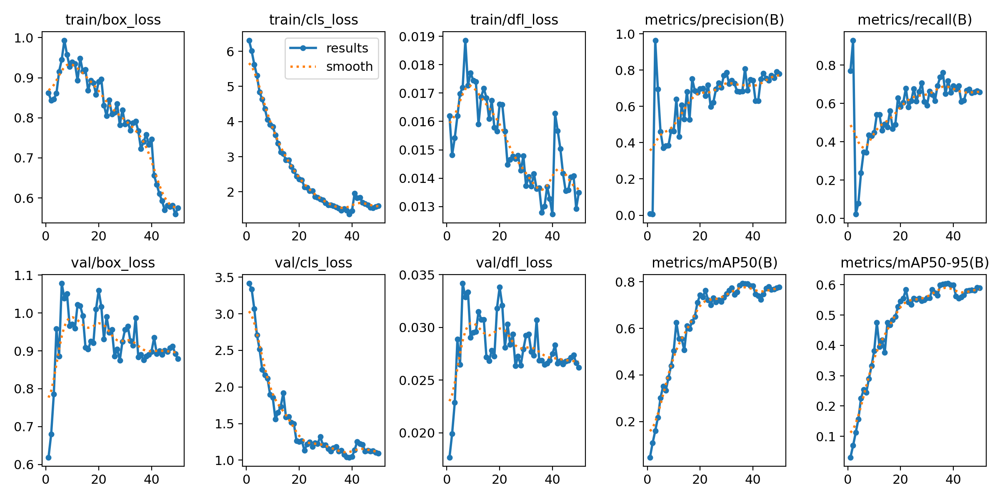

In [ ]:
from IPython.display import Image, display

results_path = "runs/detect/animals3_yolo26/"

print("График обучения:")
display(Image(filename=f"{results_path}results.png", width=900))

Матрица ошибок:


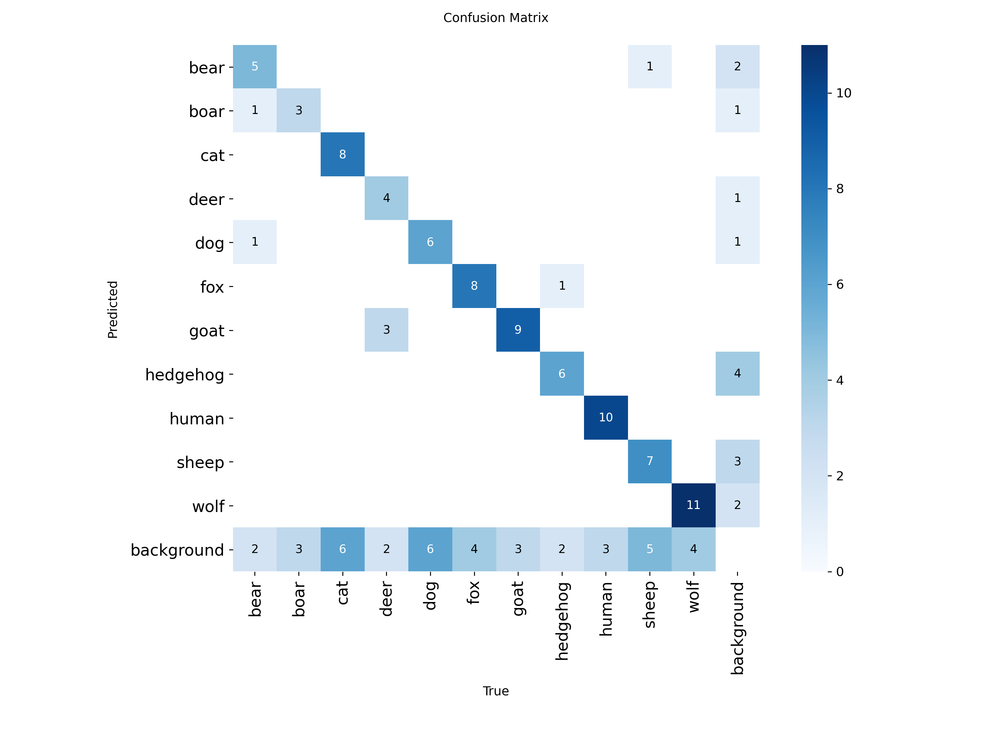

Нормализованная матрица ошибок:


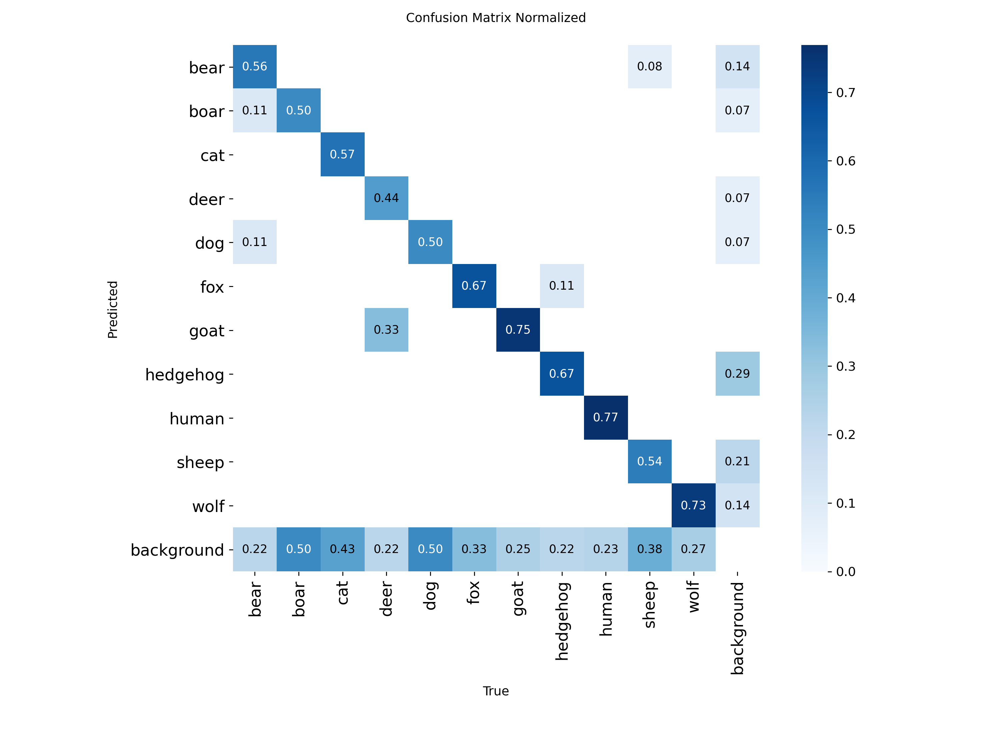

In [ ]:
print("Матрица ошибок:")
display(Image(filename=f"{results_path}confusion_matrix.png", width=700))

print("Нормализованная матрица ошибок:")
display(Image(filename=f"{results_path}confusion_matrix_normalized.png", width=700))

In [ ]:
predict_results = model.predict(
    source=f"{dataset.location}/valid/images",
    conf=0.25,
    save=False
)


image 1/107 /content/Animals-1/valid/images/029c926ce9_jpg.rf.700eefc5d17fc0d6325e20d62eaad18a.jpg: 640x640 (no detections), 13.9ms
image 2/107 /content/Animals-1/valid/images/05fa57874a_jpg.rf.7e54883292883c759a4afd3ea4522421.jpg: 448x640 2 wolfs, 58.3ms
image 3/107 /content/Animals-1/valid/images/062cb07b82_jpg.rf.e2ab9030e9bf5338c2adf5190a2c1834.jpg: 448x640 2 goats, 11.2ms
image 4/107 /content/Animals-1/valid/images/087d293433_jpg.rf.18a007e9ecd51176799b055800024004.jpg: 384x640 (no detections), 58.3ms
image 5/107 /content/Animals-1/valid/images/093836b753_jpg.rf.cd3c5aec3815baabe2194a680391c4a5.jpg: 384x640 2 bears, 9.2ms
image 6/107 /content/Animals-1/valid/images/0_png.rf.c2ae5aab5562c812ed431b45b77af618.jpg: 640x640 1 human, 9.4ms
image 7/107 /content/Animals-1/valid/images/0ae0157e0c_jpg.rf.cda2e61b0fca2160aa4e2cff6b151121.jpg: 480x640 2 foxs, 69.0ms
image 8/107 /content/Animals-1/valid/images/0b7a9869c6_jpg.rf.45b5a8ddf1d87dfacdb86399e8ba488a.jpg: 384x640 1 hedgehog, 10.7ms


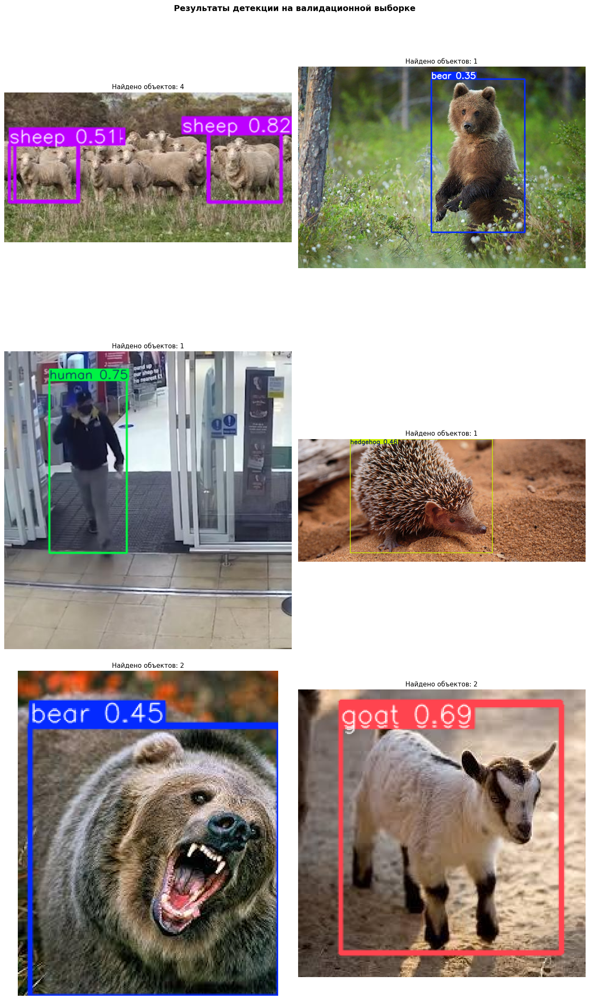

In [ ]:
import matplotlib.pyplot as plt
import cv2
import random

def visualize_predictions(results, num_samples=6):
    selected = random.sample(results, min(num_samples, len(results)))

    cols = 2
    rows = (num_samples + 1) // 2
    fig, axes = plt.subplots(rows, cols, figsize=(14, 8*rows))
    axes = axes.flatten()

    for ax, result in zip(axes, selected):
        annotated = result.plot()
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated_rgb)
        ax.set_title(f'Найдено объектов: {len(result.boxes)}', fontsize=11)
        ax.axis('off')

    for ax in axes[len(selected):]:
        ax.axis('off')

    plt.suptitle('Результаты детекции на валидационной выборке', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

visualize_predictions(predict_results, num_samples=6)

In [ ]:
project.version(1).deploy(
    model_type="yolov8",
    model_path="runs/detect/animals3_yolo26/"
)

Dependency ultralytics==8.0.196 is required but found version=8.4.48, to fix: `pip install ultralytics==8.0.196`
Would you like to continue with the wrong version of ultralytics? y/n: y
View the status of your deployment at: https://app.roboflow.com/study-btrrr/animals-jslww-inpuu/1
Share your model with the world at: https://universe.roboflow.com/study-btrrr/animals-jslww-inpuu/model/1


## **Задание 3. Сформируйте свой датасет для детекции объектов и обучите на нем модель YOLOv26**



Требования к датасету:

- Количество изображений в датасете: минимум 90
- Количество классов: более 2х
- Обязательно должны присутствовать изображения, содержащие несколько классов одновременно


*Примечание: Формирование датасета включает в себя поиск изображений и ручное аннотирование объектов на изображениях.*

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="9EGEPV4Akg5FiugcLz0k")
project = rf.workspace("study-btrrr").project("fruits-detection-fy6de")
version = project.version(2)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to fruits-detection-2 in yolov8:: 100%|██████████| 239/239 [00:00<00:00, 6274.30it/s]


In [ ]:
from ultralytics import YOLO

model = YOLO("yolo26n.pt")

results = model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    name="fruits_yolo26"
)

Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fruits-detection-2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=fruits_yolo26-3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=T

In [ ]:
metrics = model.val()
print(f"mAP50:     {metrics.box.map50:.3f}")
print(f"mAP50-95:  {metrics.box.map:.3f}")
print(f"Precision: {metrics.box.mp:.3f}")
print(f"Recall:    {metrics.box.mr:.3f}")

Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n summary (fused): 122 layers, 2,375,421 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 908.4±304.7 MB/s, size: 25.4 KB)
val: Scanning /content/fruits-detection-2/valid/labels.cache... 23 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 23/23 9.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.0it/s 1.0s
                   all         23         55      0.846        0.8      0.868      0.676
                 apple         13         14      0.798      0.846      0.906      0.756
                banana         13         16      0.897      0.875      0.966      0.725
                orange         11         25      0.844       0.68      0.731      0.547
Speed: 9.0ms preprocess, 20.1ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /content/runs/detect/val
mAP50:

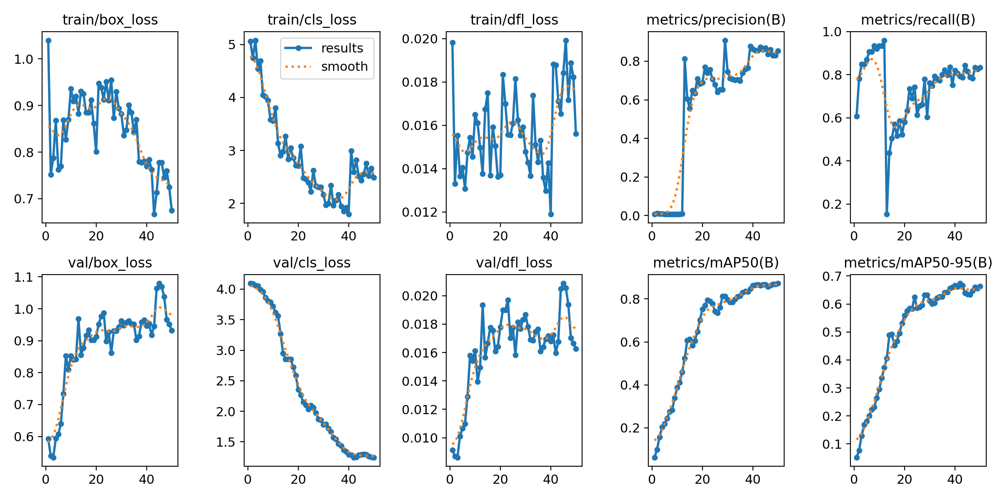

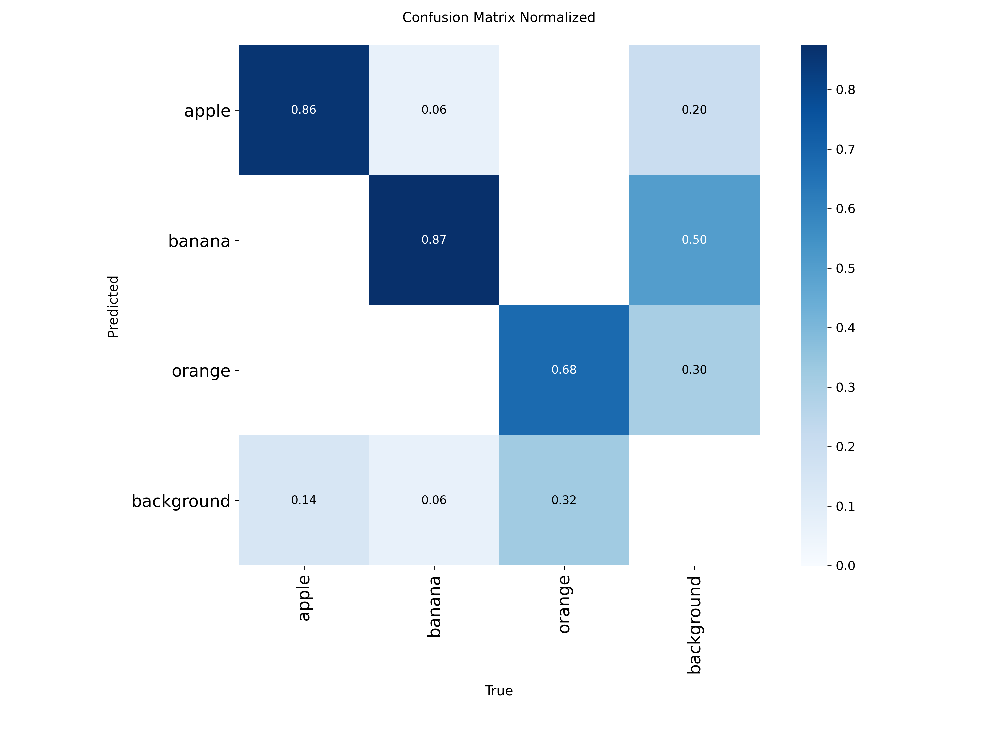

In [ ]:
from IPython.display import Image, display

results_path = "runs/detect/fruits_yolo26-3/"

display(Image(filename=f"{results_path}results.png", width=900))
display(Image(filename=f"{results_path}confusion_matrix_normalized.png", width=700))

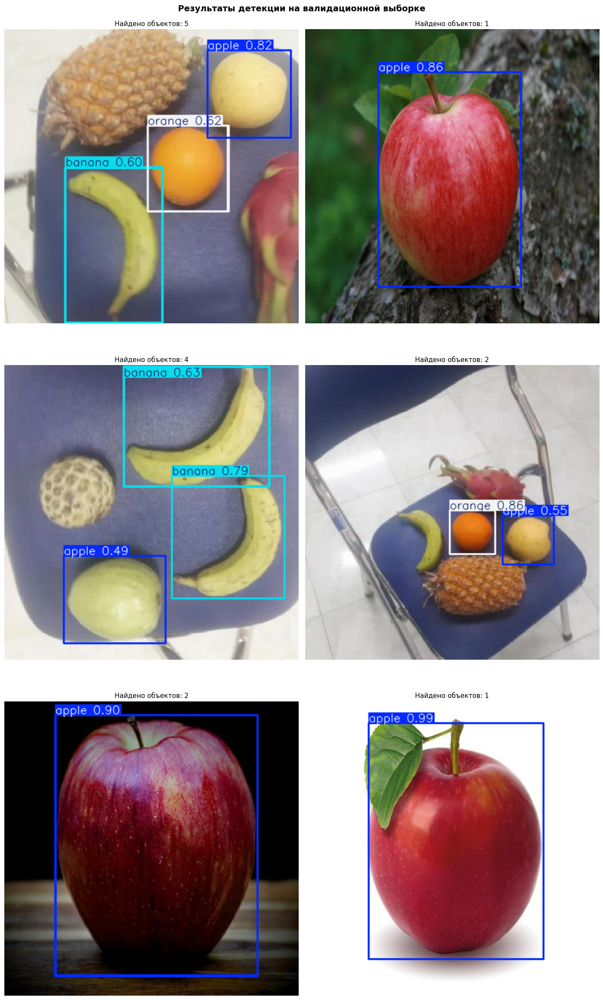

In [ ]:
import matplotlib.pyplot as plt
import cv2
import random

def visualize_predictions(results, num_samples=6):
    selected = random.sample(results, min(num_samples, len(results)))

    cols = 2
    rows = (num_samples + 1) // 2
    fig, axes = plt.subplots(rows, cols, figsize=(14, 8*rows))
    axes = axes.flatten()

    for ax, result in zip(axes, selected):
        annotated = result.plot()
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated_rgb)
        ax.set_title(f'Найдено объектов: {len(result.boxes)}', fontsize=11)
        ax.axis('off')

    for ax in axes[len(selected):]:
        ax.axis('off')

    plt.suptitle('Результаты детекции на валидационной выборке', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

visualize_predictions(predict_results, num_samples=6)

In [ ]:
project.version(2).deploy(
    model_type="yolov8",
    model_path="runs/detect/fruits_yolo26-3/"
)

Dependency ultralytics==8.0.196 is required but found version=8.4.51, to fix: `pip install ultralytics==8.0.196`
Would you like to continue with the wrong version of ultralytics? y/n: y
View the status of your deployment at: https://app.roboflow.com/study-btrrr/fruits-detection-fy6de/2
Share your model with the world at: https://universe.roboflow.com/study-btrrr/fruits-detection-fy6de/model/2


## **Задание 4 (для магистрантов). Обучите модель YOLOv26 на датасете [RSD-GOD](https://github.com/Dr-Zhuang/geospatial-object-detection). Затем самостоятельно сформируйте тестовые данные (не менее 50 изображений с аннотациями) и оцените качество обученной модели:**



**Прямая ссылка на загрузку датасета: [загрузить](https://drive.google.com/open?id=1ttvSta0BRxW7tTV_st89vSb_obHVre34)**

**Ссылка на датасет в среде roboflow universe:** https://universe.roboflow.com/animals-sqrdn/rsd-god

 *Примечание: для поиска данных удобно использовать сервис Google Earth/Google Earth Engine*

In [1]:
# Ваш код
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="9EGEPV4Akg5FiugcLz0k")
project = rf.workspace("study-btrrr").project("rsd-god-bohh4")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to RSD-GOD-1 in yolov8:: 100%|██████████| 19685/19685 [00:05<00:00, 3831.83it/s] 


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [2]:
from ultralytics import YOLO

model = YOLO("yolo26n.pt")

results = model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    name="rsd_god_yolo26"
)

Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/RSD-GOD-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rsd_god_yolo26, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patie

Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n summary (fused): 122 layers, 2,375,811 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 952.5±479.8 MB/s, size: 26.0 KB)
val: Scanning /content/RSD-GOD-1/valid/labels.cache... 1969 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1969/1969 825.9Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 124/124 6.7it/s 18.4s
                   all       1969       4267      0.961       0.96      0.982      0.676
               airport        331        336      0.972      0.964      0.987      0.699
            helicopter        252        690      0.985      0.976      0.984      0.707
               oiltank        430       1094      0.965      0.948      0.984      0.663
                 plane        591       1469      0.972      0.966       0.98      0.566
               warship        383     

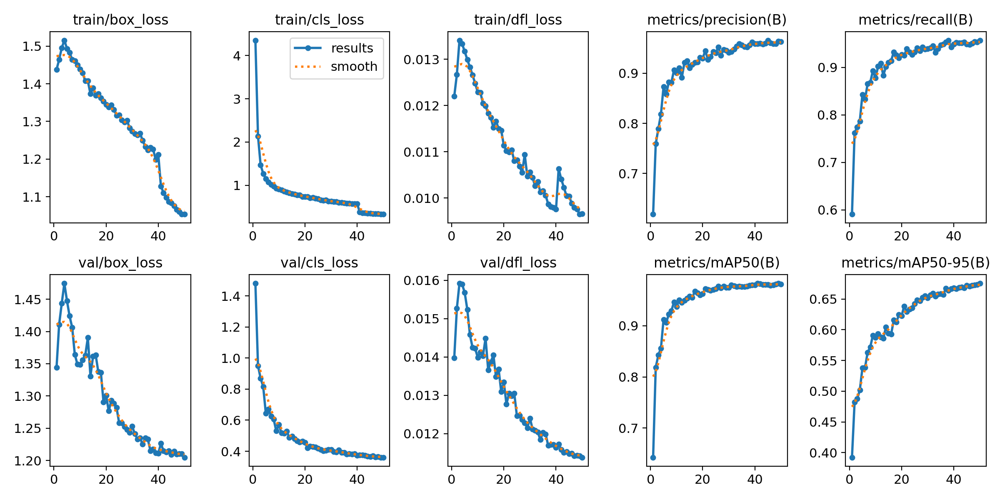

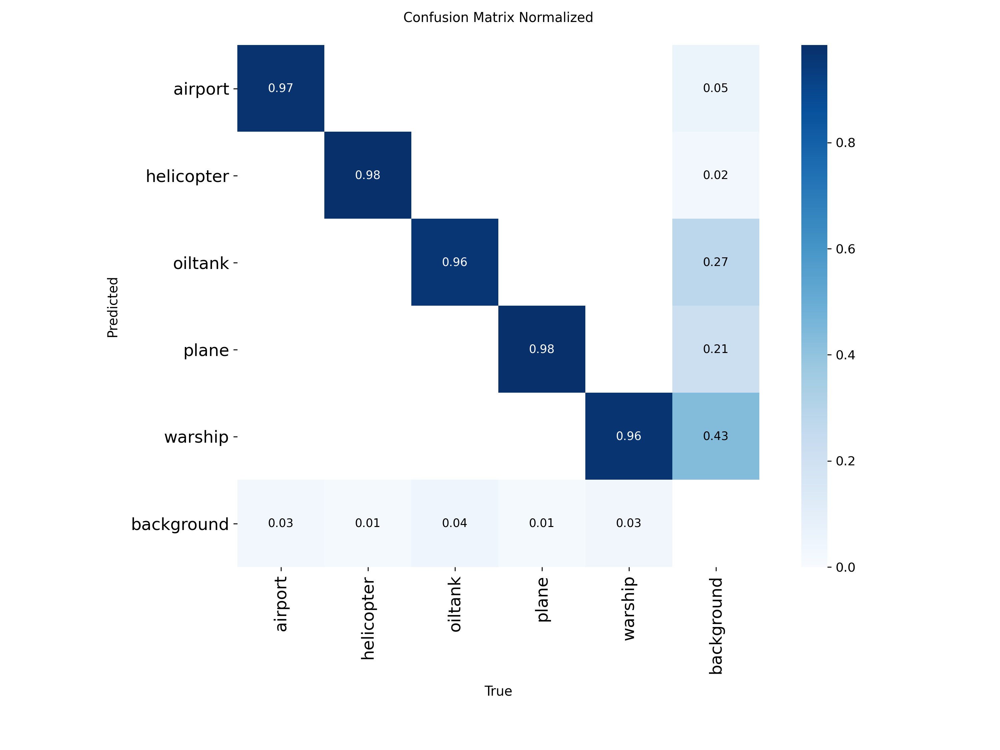

In [3]:
from IPython.display import Image, display

results_path = "runs/detect/rsd_god_yolo26/"

# Метрики
metrics = model.val()
print(f"mAP50:     {metrics.box.map50:.3f}")
print(f"mAP50-95:  {metrics.box.map:.3f}")
print(f"Precision: {metrics.box.mp:.3f}")
print(f"Recall:    {metrics.box.mr:.3f}")

# Графики
display(Image(filename=f"{results_path}results.png", width=900))
display(Image(filename=f"{results_path}confusion_matrix_normalized.png", width=700))


In [6]:
from roboflow import Roboflow
from ultralytics import YOLO

# Загружаем тестовый датасет
rf = Roboflow(api_key="9EGEPV4Akg5FiugcLz0k")
project = rf.workspace("study-btrrr").project("rsd-god-test")
version = project.version(1)
test_dataset = version.download("yolov8")

# Загружаем обученную модель
model = YOLO("runs/detect/rsd_god_yolo26/weights/best.pt")

# Оцениваем на тестовых данных
test_metrics = model.val(
    data=f"{test_dataset.location}/data.yaml",
    split="test"
)

print(f"mAP50:     {test_metrics.box.map50:.3f}")
print(f"mAP50-95:  {test_metrics.box.map:.3f}")
print(f"Precision: {test_metrics.box.mp:.3f}")
print(f"Recall:    {test_metrics.box.mr:.3f}")

loading Roboflow workspace...
loading Roboflow project...
Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n summary (fused): 122 layers, 2,375,811 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1422.3±510.9 MB/s, size: 40.5 KB)
val: Scanning /content/rsd-god-test-1/test/labels... 49 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 49/49 2.1Kit/s 0.0s
val: New cache created: /content/rsd-god-test-1/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.9it/s 2.1s
                   all         49        132      0.759      0.798      0.778      0.396
               airport         10         10      0.197        0.2       0.22      0.114
            helicopter         11         30      0.994          1      0.995        0.5
               oiltank         17         26      0.717      0.885      0.776      0.333
                 


image 1/49 /content/rsd-god-test-1/test/images/airbase_100_jpg.rf.ebbf3bc1c0ae73a22f6c8d503dafa3f6.jpg: 640x576 1 airport, 62.5ms
image 2/49 /content/rsd-god-test-1/test/images/airbase_1092_jpg.rf.950b898f3d810565e8a5789eaa2d71ef.jpg: 544x640 1 airport, 58.3ms
image 3/49 /content/rsd-god-test-1/test/images/airbase_1119_jpg.rf.ffac23435b711c9d16d6e9f987a8b4cf.jpg: 544x640 1 airport, 10.0ms
image 4/49 /content/rsd-god-test-1/test/images/airbase_1167_jpg.rf.8ecd66bd2d5e9b8d5ac03d7adf535e1e.jpg: 544x640 1 airport, 9.5ms
image 5/49 /content/rsd-god-test-1/test/images/airbase_1180_jpg.rf.edb192de28699694103a8f098936624f.jpg: 640x640 1 airport, 10.0ms
image 6/49 /content/rsd-god-test-1/test/images/airbase_1187_jpg.rf.24f0fadefce3facec7634360d8a149f3.jpg: 608x640 1 airport, 60.5ms
image 7/49 /content/rsd-god-test-1/test/images/airbase_1209_jpg.rf.8b88c21c74e8fa5adf0742159ca8c8ca.jpg: 544x640 1 airport, 9.9ms
image 8/49 /content/rsd-god-test-1/test/images/airbase_1279_jpg.rf.6b8ee7b27688a79983

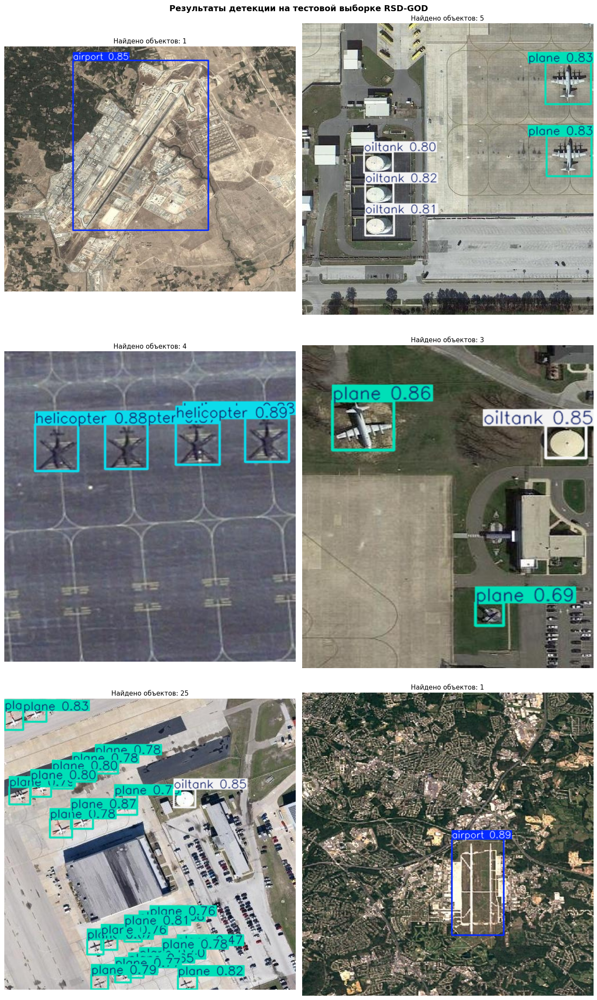

In [7]:
import matplotlib.pyplot as plt
import cv2
import random

def visualize_predictions(results, num_samples=6):
    selected = random.sample(results, min(num_samples, len(results)))
    cols = 2
    rows = (num_samples + 1) // 2
    fig, axes = plt.subplots(rows, cols, figsize=(14, 8*rows))
    axes = axes.flatten()
    for ax, result in zip(axes, selected):
        annotated = result.plot()
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated_rgb)
        ax.set_title(f'Найдено объектов: {len(result.boxes)}', fontsize=11)
        ax.axis('off')
    for ax in axes[len(selected):]:
        ax.axis('off')
    plt.suptitle('Результаты детекции на тестовой выборке RSD-GOD', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

test_results = model.predict(
    source="/content/rsd-god-test-1/test/images",
    conf=0.25,
    save=False
)

visualize_predictions(test_results, num_samples=6)